In [46]:
from PIL import Image, ImageFilter, ImageEnhance, ImageDraw, ImageFont


In [47]:
import os

In [48]:
os.listdir()

['architecture.jpg',
 'bulb.jpg',
 'bulbbb.png',
 'flowers.jpg',
 'generated',
 'image_processing.ipynb',
 'pattern.png',
 'rotated_church.png',
 'train.jpg',
 'vaulted_celler.jpg',
 'webcam.py']

In [50]:
im1=Image.open('architecture.jpg')
im2=Image.open('bulb.jpg')
im3=Image.open('train.jpg')
im4=Image.open('vaulted_celler.jpg')
im5=Image.open('flowers.jpg')
im0=Image.open('pattern.png') #Format: PNG, Mode: RGBA, Size: (180, 263)

In [5]:
print(im1)

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=900x720 at 0x27B13F71190>


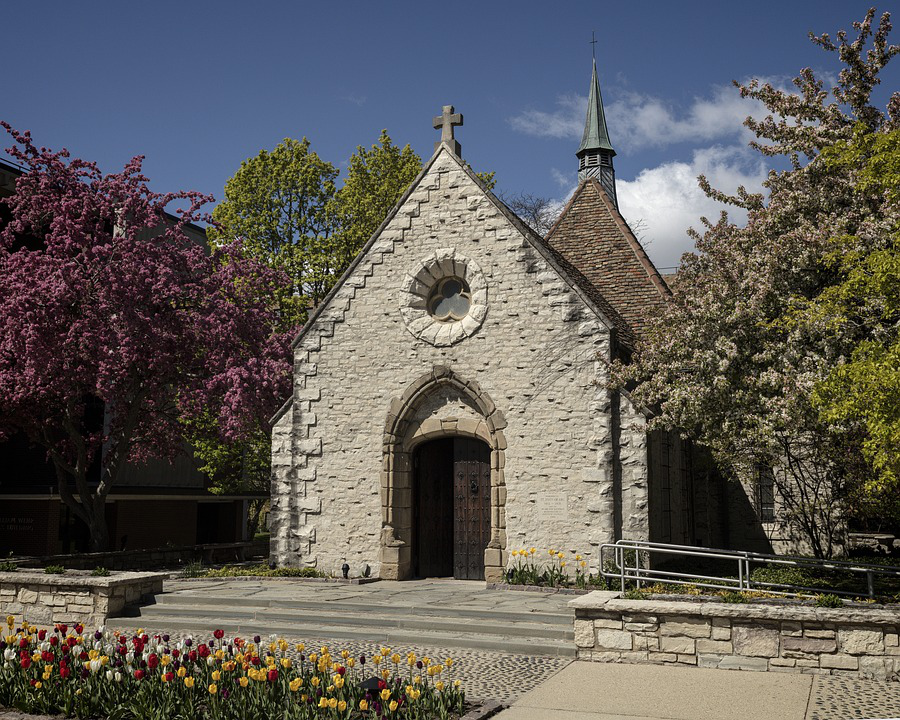

In [6]:
im1

In [54]:
print(f'Format: {im0.format}')
print(f'Mode: {im0.mode}')
print(f'Size: {im0.size}')
print(f'Info: {im1.info}')

Format: PNG
Mode: RGBA
Size: (180, 263)
Info: {'jfif': 257, 'jfif_version': (1, 1), 'jfif_unit': 0, 'jfif_density': (1, 1)}



Mode |    Description
-----|-------------------------------------------------------------

1    | 1-bit pixels, black and white
-----|---------------
L    | 8-bit pixels, Greyscale
P    | 8-bit pixels, mapped to any other mode using a color palette
RGB  | 3×8-bit pixels, true color
RGBA | 4×8-bit pixels, true color with transparency mask


resizing the images

In [8]:
h= im1.height
w=im1.width
# scale to 3x that is 3 times more in size
im1_bigger=im1.resize((w*3, h*3))
im1_bigger.show()

In [55]:
pat_logo = im0.resize((im0.width//3, im0.height//3))  #reduce size by 1/3
pat_logo.show()

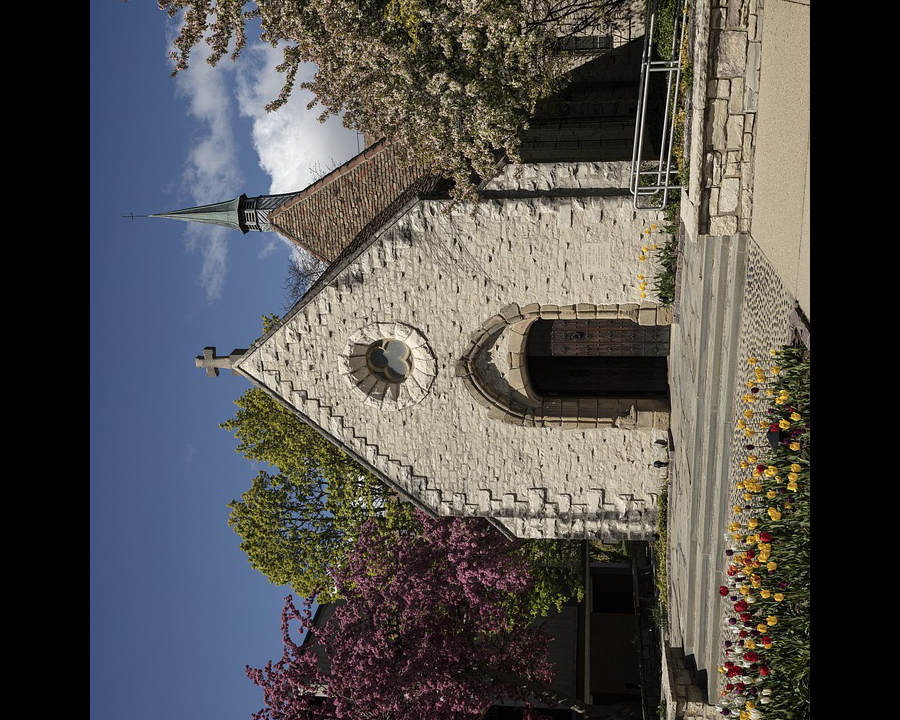

In [10]:
im1.rotate(90)

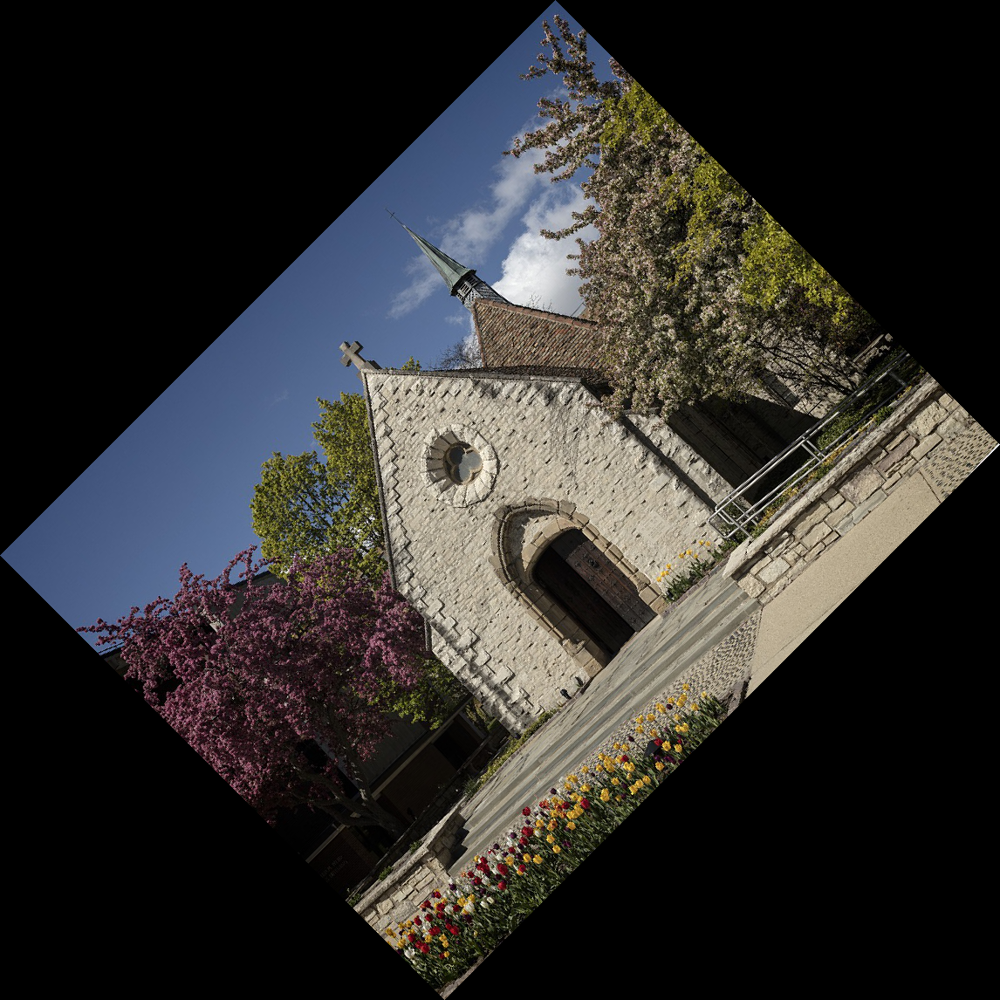

In [11]:
im1.rotate(45, expand=True)

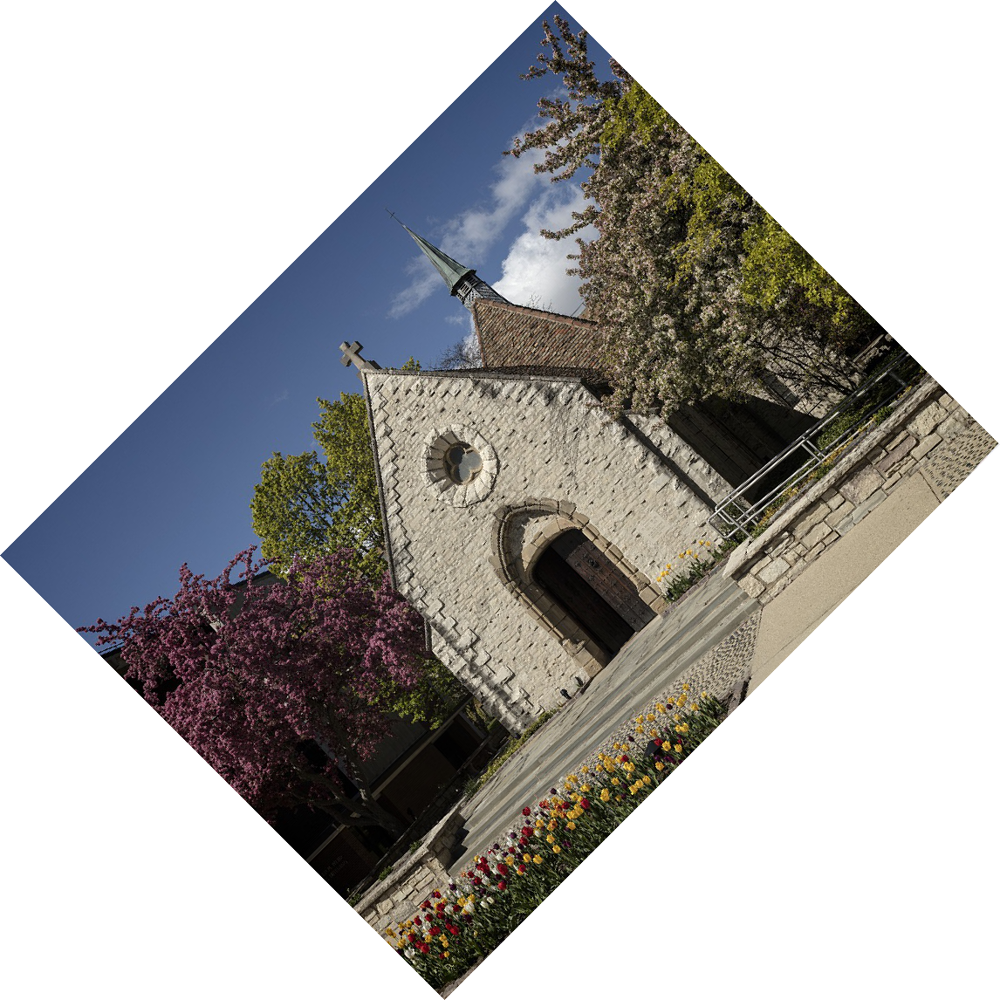

In [12]:
im1.rotate(45, expand=True, fillcolor='white')

In [13]:
# for saving the image after rotation
im1.rotate(45, expand=True).save('rotated_church.png')  # namethe new file

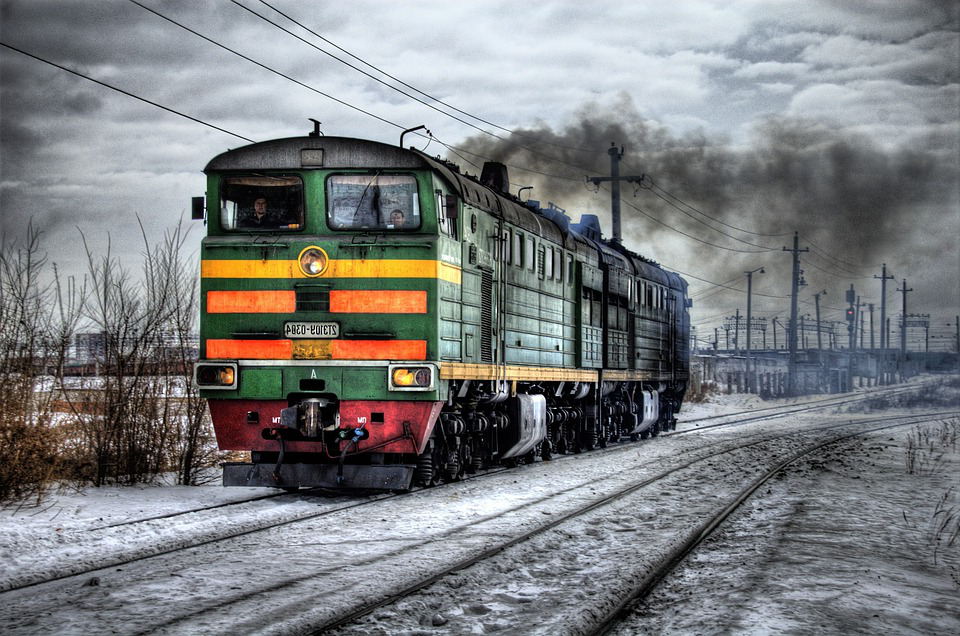

In [40]:
#flipping the image by transpose

im3.transpose(Image.Transpose.FLIP_LEFT_RIGHT)

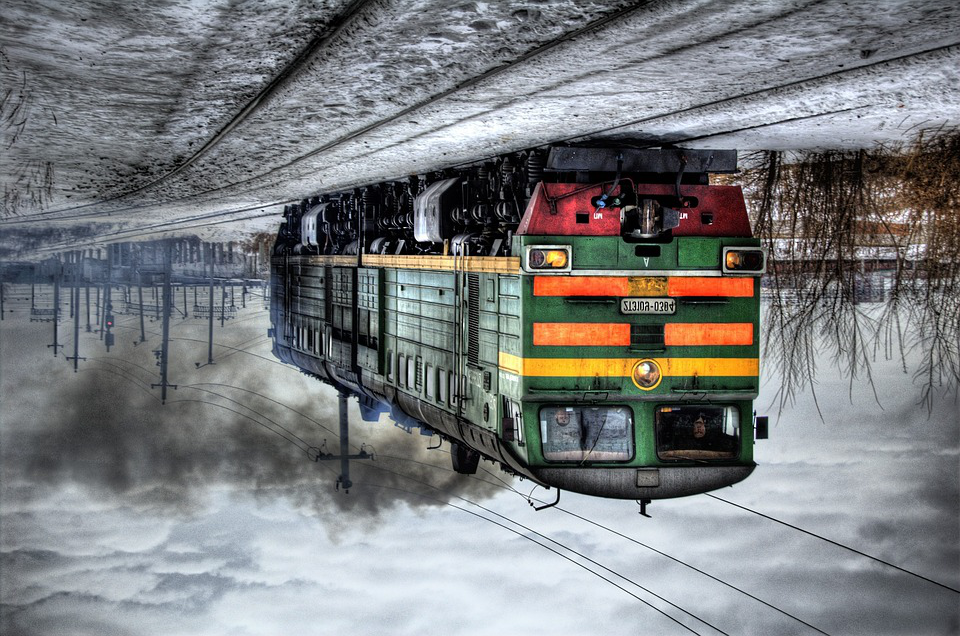

In [15]:

im3.transpose(Image.Transpose.FLIP_TOP_BOTTOM)

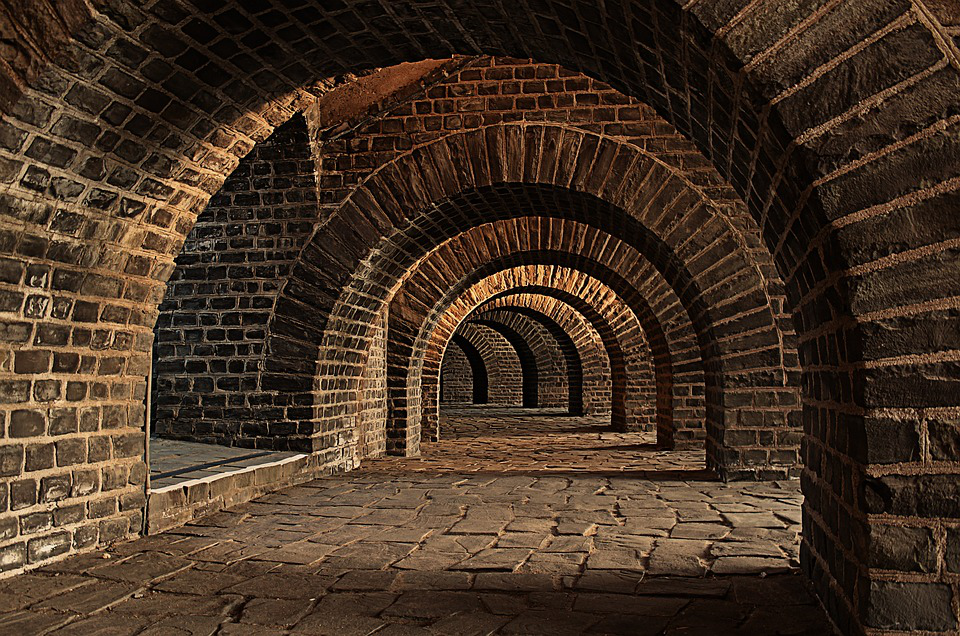

In [16]:
im4

- (0,0) is the upper left corner
- coordinates are passed as a tuple in the form (x,y)
- rectangles are represented as 4 tuples, the upper left corner is provided first. 

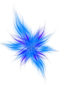

In [56]:
pat_logo

In [57]:
w, h = pat_logo.width, pat_logo.height
pat_logo = pat_logo.resize((w//2, h//2)) #50% of original size
pat_logo

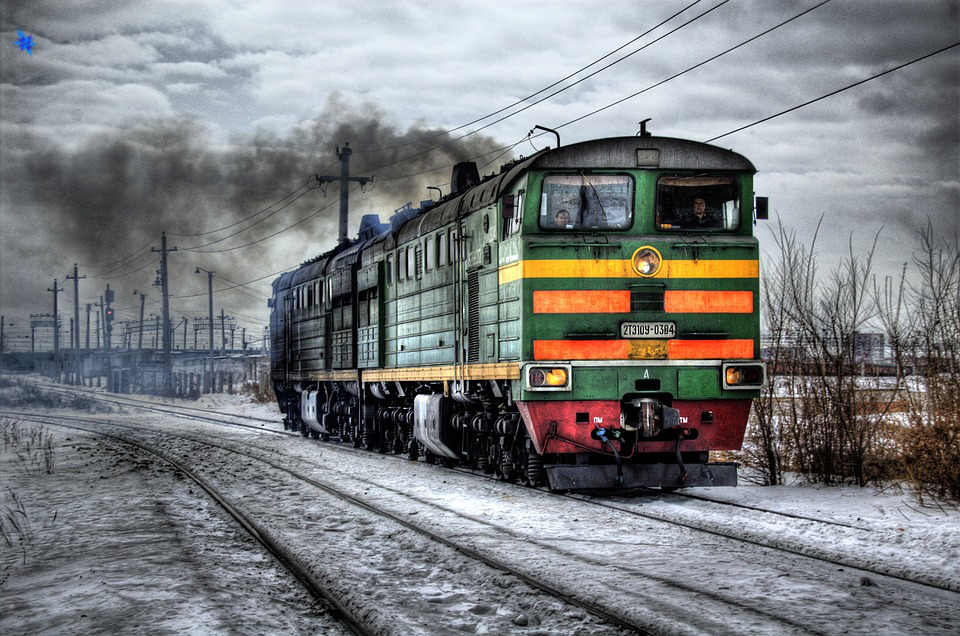

In [60]:
wallpaper = im3.copy()
#mask=flowershop_logo --> image must be a RGBA then only it will work
#wallpaper.paste(flowershop_logo, (10,20), mask=flowershop_logo) #mask is used to display make data transparent 
wallpaper.paste(pat_logo, (10,20), mask=pat_logo) #mask makes the background transparent
#wallpaper.paste(pat_logo, (10,20)) #--> use this when image is not RGBA
wallpaper

#### cropping the image

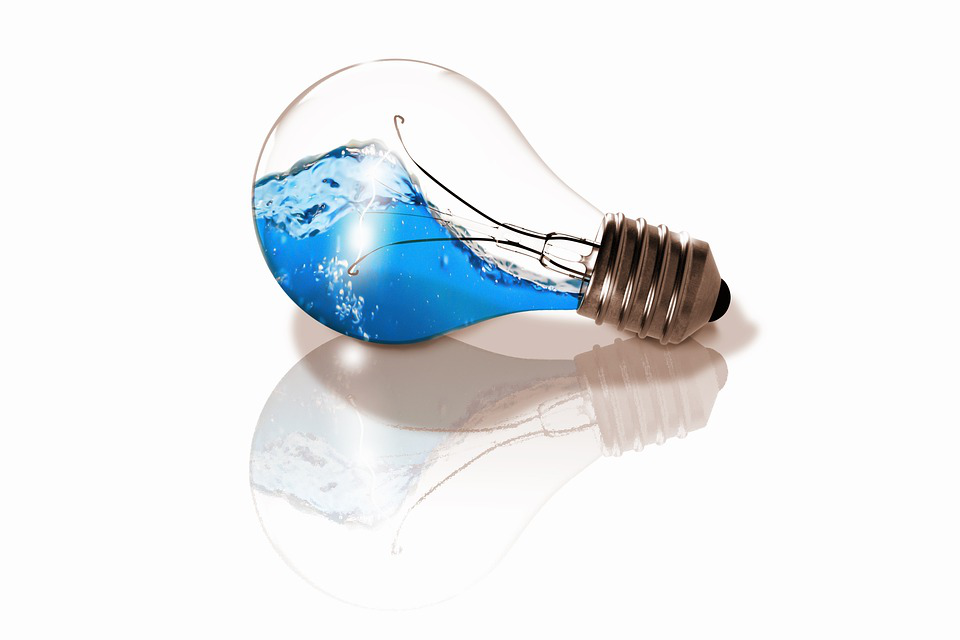

In [20]:
im2

In [62]:
im2.size

(960, 640)

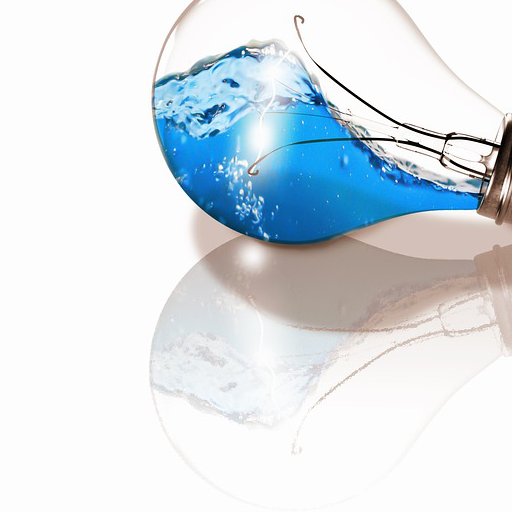

In [22]:
w,h= im2.width, im2.height
im2.crop((100,100,  612,612))

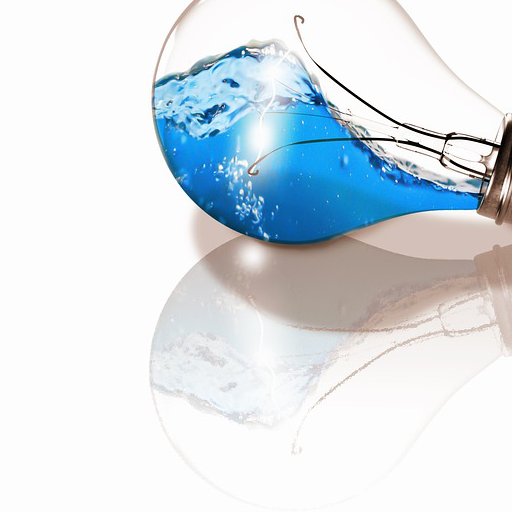

In [23]:
w,h= im2.width, im2.height
grad_image= im2.crop((100,100,  612,612))
grad_image

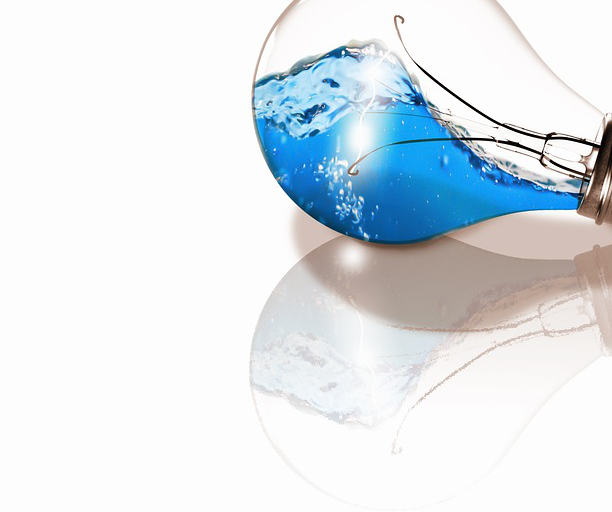

In [24]:
w,h= im2.width, im2.height
clean_logo=im2.crop((0,100,  612,612)) 
clean_logo.save('bulbbb.png')
clean_logo

##### BLENDING

In [25]:
a= grad_image.resize((im1.width, im1.height))
b=im1.copy()
a=a.convert('RGB')
b=b.convert('RGB')

In [26]:
c= im2.resize((im1.width, im1.height))
c=c.convert('RGB')

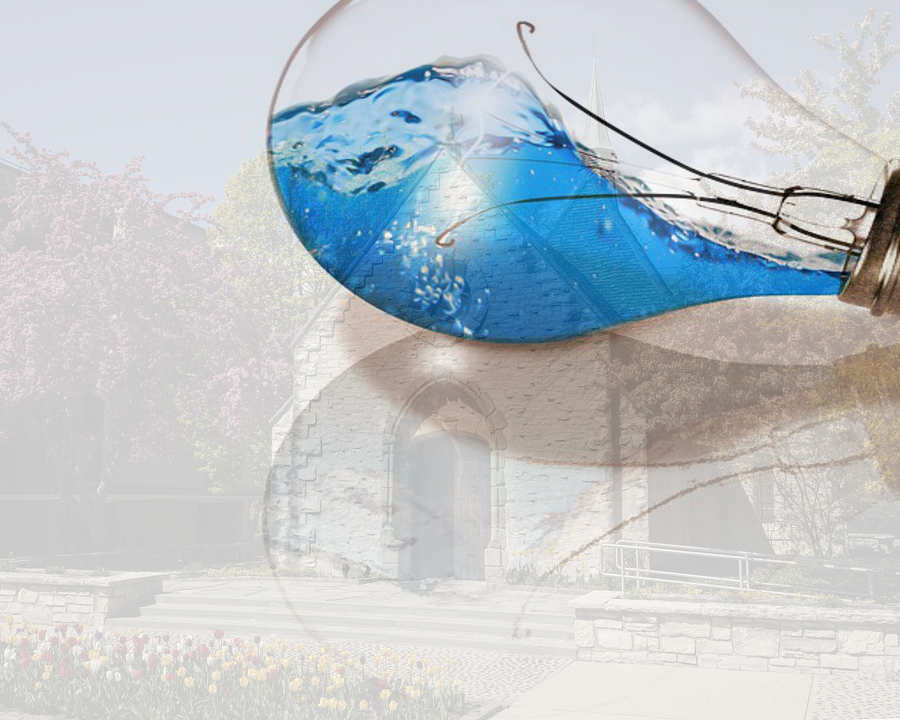

In [27]:
Image.blend(a, b , .2)
#Image.blend(a, b , .8)

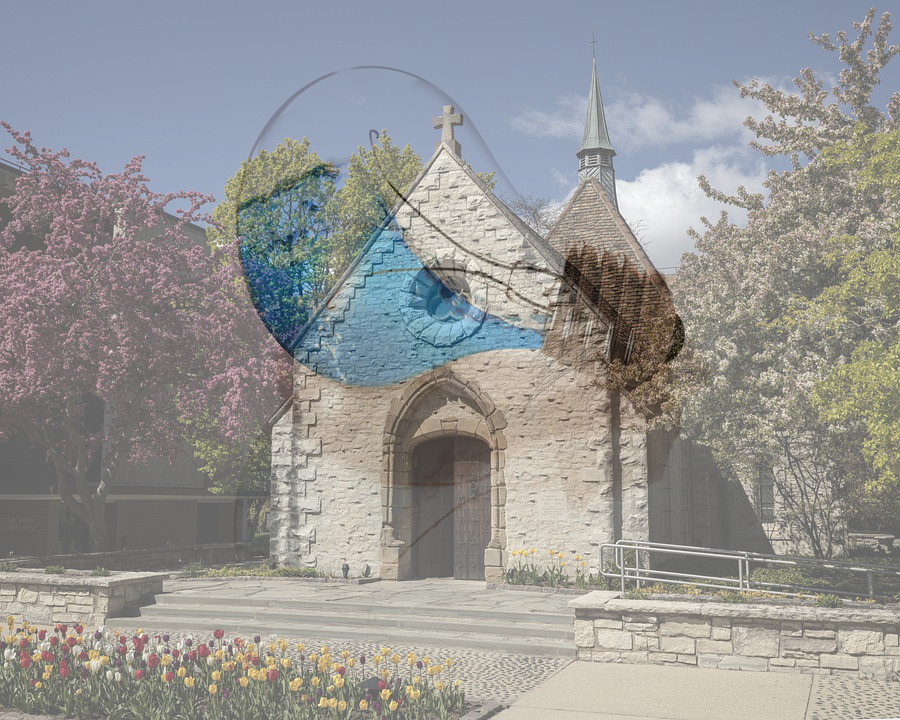

In [28]:
Image.blend( b ,c, .4)

#### FILTERS

In [29]:
filter = [
    ImageFilter.BLUR,
    ImageFilter.CONTOUR,
    ImageFilter.DETAIL,
    ImageFilter.EDGE_ENHANCE,
    ImageFilter.EDGE_ENHANCE_MORE,
    ImageFilter.EMBOSS,
    ImageFilter.FIND_EDGES,
    ImageFilter.SMOOTH,
    ImageFilter.SMOOTH_MORE,
    ImageFilter.SHARPEN

]

for i,f in enumerate(filter):
    im4.filter(f).save(f'generated/filter_{i}.png')

In [30]:
im2.filter(ImageFilter.MaxFilter(3)).show()
im2.filter(ImageFilter.MinFilter(11)).show()
im2.filter(ImageFilter.ModeFilter(7)).show()
im2.filter(ImageFilter.MedianFilter(3)).show()
im2.filter(ImageFilter.GaussianBlur(3)).show()  #blurs from 0 to 100 but don't use 100 it burdens the system


#### enhancing images

An enhancement factor of 0.0 results in a full black image and an enhancement factor of 1.0 results the same as the original image.

Color(): Adjust image color level. It’s accustomed to controlling the color level of our resulting image.

In [31]:
enIm1=ImageEnhance.Color(im1)
enIm1.enhance(-1).show()

In [32]:

for i in range(-10,11):
    enIm1.enhance(i).save(f'generated/colorboost_{i}.png')

In [41]:
curr_col = ImageEnhance.Color(im3)
new_col = 2.5
  
# Color level enhanced by a factor of 2.5
img_colored = curr_col.enhance(new_col)
  
# shows updated image in image viewer
img_colored.show()

In [37]:
  
# Enhance Brightness
curr_bri = ImageEnhance.Brightness(im3)
  
# Brightness enhanced by a factor of 2.5
img_brightened = curr_bri.enhance(2.5)
  
# shows updated image in image viewer
img_brightened.show()  

- An enhancement factor of 0.0 results in a blurred image and 
- an enhancement factor of 1.0 results in the same as the original image and 
- a factor > 1.0 results in a sharpened image.

In [44]:
# Enhance Sharpness
curr_sharp = ImageEnhance.Sharpness(im5)
new_sharp = 8.3
  
# Sharpness enhanced by a factor of 8.3
img_sharped = curr_sharp.enhance(new_sharp)
  
# shows updated image in image viewer
img_sharped.show()

#### Drawing on images

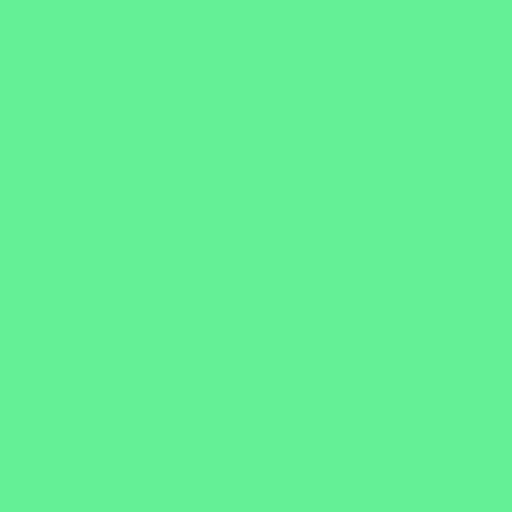

In [33]:
# a green image of 512x512
im6= Image.new('RGB', (512,512), (100,240,150))
im6

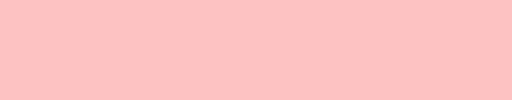

In [34]:
im7= Image.new('RGBA', (512,100), (250, 100,100,100))
im7

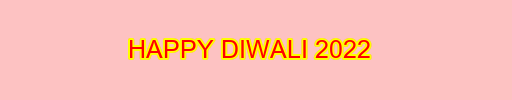

In [35]:

msg ="HAPPY DIWALI 2022"
font = "arial.ttf"
fontsize = 25
fontcolor = 'red'
font = font=ImageFont.truetype(font, fontsize)
pos = (512//4, 35)
draw_im7 = ImageDraw.Draw(im7)
draw_im7.text(pos, msg, fontcolor, font, align='center',
    stroke_width=2, stroke_fill='yellow')
im7

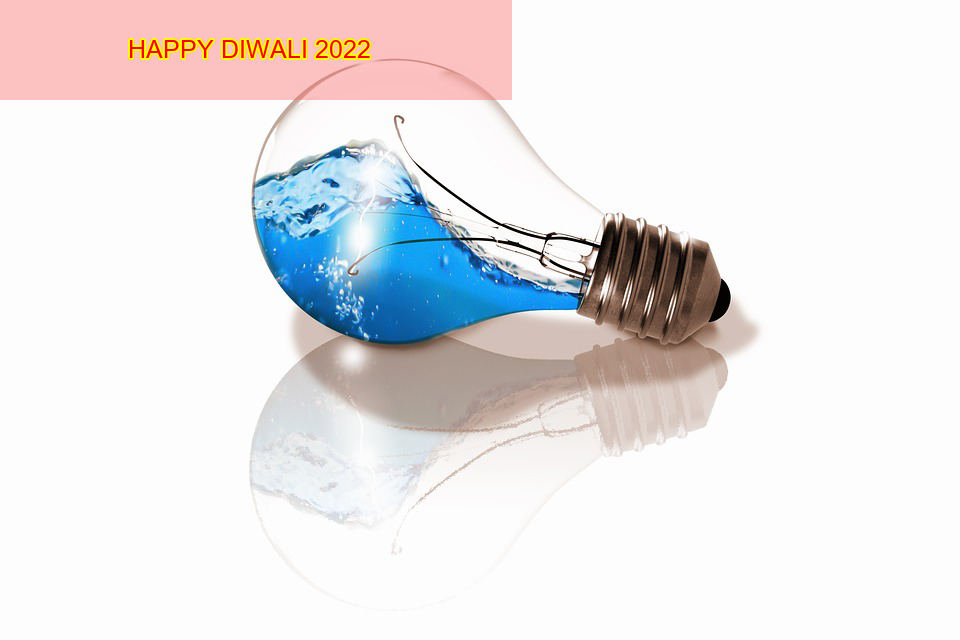

In [36]:
im2.paste(im7, (0, 0), mask=im7)
im2